We'll cover the following steps to fine-tune text detection models of PaddleOCR and to make inference with our fine-tuned model.

1. Clone the PaddleOCR GitHub repository
2. Install the framework PaddlePaddle, the gpu version
3. Install the package PaddleOCR
4. Get the data
5. Get the pretrained model
6. Train and evaluate the model
7. Make inference on new images


First, we need to clone the GitHub repository of PaddleOCR.

In [1]:
!git clone https://github.com/PaddlePaddle/PaddleOCR.git

Cloning into 'PaddleOCR'...
remote: Enumerating objects: 58565, done.
remote: Counting objects: 100% (7635/7635), done.
remote: Compressing objects: 100% (1701/1701), done.
remote: Total 58565 (delta 6225), reused 7240 (delta 5932), pack-reused 50930 (from 1)
Receiving objects: 100% (58565/58565), 421.89 MiB | 38.83 MiB/s, done.
Resolving deltas: 100% (41900/41900), done.
Updating files: 100% (2401/2401), done.


Next, we have to install the gpu version of PaddlePaddle, the core deep learning framework needed to run PaddleOCR. You may want consult the [PaddleOCR Quick Start](https://github.com/PaddlePaddle/PaddleOCR/blob/58e876d38d92b722f527946954c12231cd7ef7c6/doc/doc_en/quickstart_en.md). 

In [2]:
!python -m pip install -q paddlepaddle-gpu==2.5.0.post118 -f https://www.paddlepaddle.org.cn/whl/linux/mkl/avx/stable.html
!pip install -q "paddleocr>=2.0.1" # Recommend to use version 2.0.1+
!pip install -q imutils
!pip install -q gdown

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.22.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.10.0, but you have google-cloud-bigquery 2.34.4 which is incompatible.
bigframes 0.22.0 requires google-cloud-storage>=2.0.0, but you have google-cloud-storage 1.44.0 which is incompatible.
bigframes 0.22.0 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.2 which is incompatible.
cesium 0.12.3 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
dataproc-jupyter-plugin 0.1.79 requires pydantic~=1.10.0, but you have pydantic 2.9.2 which is incompatible.


We're going to verify that our gpu paddle installation succeed with:

In [3]:
import paddle
gpu_available  = paddle.device.is_compiled_with_cuda()
print("GPU available:", gpu_available)

GPU available: True


In [4]:
paddle.utils.run_check()

Running verify PaddlePaddle program ... 


I1103 04:32:27.085585    24 interpretercore.cc:237] New Executor is Running.
W1103 04:32:27.086083    24 gpu_resources.cc:119] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.4, Runtime API Version: 11.8
W1103 04:32:27.096534    24 gpu_resources.cc:149] device: 0, cuDNN Version: 90.0.


PaddlePaddle works well on 1 GPU.


I1103 04:32:27.534034    24 interpreter_util.cc:518] Standalone Executor is Used.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_selected_gpus', current_value='1', default_value='')
I1103 04:32:29.146459    96 tcp_utils.cc:107] Retry to connect to 127.0.0.1:55075 while the server is not yet listening.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_selected_gpus', current_value='0', default_value='')
I1103 04:32:29.154580    95 tcp_utils.cc:181] The server starts to listen on IP_ANY:55075
I1103 04:32:29.154767    95 tcp_utils.cc:130] Successfully connected to 127.0.0.1:55075
I1103 04:32:32.146667    96 tcp_utils.cc:130] Successfully connected to 127.0.0.1:55075
W1103 04:32:32.375649    95 gpu_resources.cc:119] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.4, Runtime API Version: 11.8
W1103 04:32:32.376672    95 gpu_resources.cc:149] device: 0, cuDNN Version: 90.0.
W1103 04

PaddlePaddle works well on 2 GPUs.
PaddlePaddle is installed successfully! Let's start deep learning with PaddlePaddle now.


In [5]:
paddle.ones([3,3])

Tensor(shape=[3, 3], dtype=float32, place=Place(gpu:0), stop_gradient=True,
       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])

As we can see, our gpu version of paddle is functioning.

It might be useful to know that sometimes the above installation is unsuccessful, arising the following warning when running `paddle.utils.run_check()`: 
```
The GPU architecture in your current machine is Pascal, which is not compatible with Paddle installation with arch: 70 75 80 86 , it is recommended to install the corresponding wheel package according to the installation information on the official Paddle website.
```
If that happens to you, you could find a lower version of `paddlepaddle` that works out for your gpu in [this webpage](https://www.paddlepaddle.org.cn/whl/windows/mkl/avx/stable.html), where you can download the whl files. Try with different versions until you find the one that is compatible with your system,as someone shows us [here](https://blog.csdn.net/qq_37085158/article/details/132598829). It is not reccomended to use the latest version, but a stable one.

## The data

The annotations for PaddleOCR text detection models need to adhere to the next format, as indicated in the [documentation](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/dataset/ocr_datasets_en.md), and must be .txt files, one for training and the other for evaluation:
```
" Image file name             Image annotation information encoded by json.dumps"
ch4_test_images/img_61.jpg    [{"transcription": "MASA", "points": [[310, 104], [416, 141], [418, 216], [312, 179]]}, {...}]
```
* `points` are the coordinates of the bounding box.    
* `transcription` is the label of the bounding box. 

We'll fine-tune a detection model on a dataset of curved text called SCUT-CTW1500, and it turns out we are lucky because the annotations with the required format are provided by PaddleOCR! You can download them [here](https://paddleocr.bj.bcebos.com/dataset/ctw1500.zip).     

Note: `transcription` in the dataset provided by PaddleOCR is set to `0` for all bounding box instead of containing the actual text of its bounding box, but since we're focusing on a detection task rather than recognition, it doesn't matter.

## The pretrained model
PaddleOCR’s detection model supports 3 backbones (please refer to the [detection models documentation](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/detection_en.md)):
1. MobileNetV3
2. Resnet18_vd
3. Resnet50_vd

It means that the model uses one of these architectures as a feature extractor, with layers trained to identify hierarchical patterns in images. 

There are many algorithms of text detection included in PaddleOCR, for example, [DBNet](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/algorithm_det_db_en.md), [SAST](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/algorithm_det_sast_en.md), [EAST](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/algorithm_det_east_en.md), etc.

We'll employ the model  PP-OCRv3, regarded as the best model of PaddleOCR because of its precision and generalization capabilities, as mentioned on the [fine-tune](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/finetune_en.md) guide in the docs. 

* Download the .tar file from this [download link](https://paddleocr.bj.bcebos.com/PP-OCRv3/chinese/ch_PP-OCRv3_det_distill_train.tar).
* Extract the files in the .tar file, where you'll find `student.pdparams`, which will served us as our pretrained model. 

The next step is to get [the matching configuration file](https://github.com/PaddlePaddle/PaddleOCR/blob/main/configs/det/ch_PP-OCRv3/ch_PP-OCRv3_det_student.yml) for the student model.

## The configuration file

This is going to be the configuration we will utilize with our pretrained model.

In [6]:
TXT = '''
Global:
  debug: false
  use_gpu: true
  epoch_num: 9
  log_smooth_window: 20
  print_batch_step: 10
  save_model_dir: ./output/ch_PP-OCR_V3_det/
  save_epoch_step: 100
  eval_batch_step:
  - 0
  - 400
  cal_metric_during_train: false
  pretrained_model: /kaggle/input/ch-pp-ocrv3-det-distill-train/student.pdparams
  checkpoints: null
  save_inference_dir: null
  use_visualdl: false
  infer_img: doc/imgs_en/img_10.jpg
  save_res_path: ./checkpoints/det_db/predicts_db.txt
  distributed: true

Architecture:
  model_type: det
  algorithm: DB
  Transform:
  Backbone:
    name: MobileNetV3
    scale: 0.5
    model_name: large
    disable_se: True
  Neck:
    name: RSEFPN
    out_channels: 96
    shortcut: True
  Head:
    name: DBHead
    k: 50

Loss:
  name: DBLoss
  balance_loss: true
  main_loss_type: DiceLoss
  alpha: 5
  beta: 10
  ohem_ratio: 3
Optimizer:
  name: Adam
  beta1: 0.9
  beta2: 0.999
  lr:
    name: Cosine
    learning_rate: 0.0001
    warmup_epoch: 2
  regularizer:
    name: L2
    factor: 5.0e-05
PostProcess:
  name: DBPostProcess
  thresh: 0.3
  box_thresh: 0.6
  max_candidates: 1000
  unclip_ratio: 1.5
Metric:
  name: DetMetric
  main_indicator: hmean
Train:
  dataset:
    name: SimpleDataSet
    data_dir: /kaggle/input/scutctw1500-datasets/
    label_file_list:
      - /kaggle/input/scut-ctw1500-annotations-supported-by-paddleocr-2/training.txt
    ratio_list: [1.0]
    transforms:
    - DecodeImage:
        img_mode: BGR
        channel_first: false
    - DetLabelEncode: null
    - IaaAugment:
        augmenter_args:
        - type: Fliplr
          args:
            p: 0.5
        - type: Affine
          args:
            rotate:
            - -10
            - 10
        - type: Resize
          args:
            size:
            - 0.5
            - 3
    - EastRandomCropData:
        size:
        - 960
        - 960
        max_tries: 50
        keep_ratio: true
    - MakeBorderMap:
        shrink_ratio: 0.4
        thresh_min: 0.3
        thresh_max: 0.7
    - MakeShrinkMap:
        shrink_ratio: 0.4
        min_text_size: 8
    - NormalizeImage:
        scale: 1./255.
        mean:
        - 0.485
        - 0.456
        - 0.406
        std:
        - 0.229
        - 0.224
        - 0.225
        order: hwc
    - ToCHWImage: null
    - KeepKeys:
        keep_keys:
        - image
        - threshold_map
        - threshold_mask
        - shrink_map
        - shrink_mask
  loader:
    shuffle: true
    drop_last: false
    batch_size_per_card: 8
    num_workers: 4
Eval:
  dataset:
    name: SimpleDataSet
    data_dir: /kaggle/input/scutctw1500-datasets/
    label_file_list:
      - /kaggle/input/scut-ctw1500-annotations-supported-by-paddleocr-2/test.txt
    transforms:
    - DecodeImage:
        img_mode: BGR
        channel_first: false
    - DetLabelEncode: null
    - DetResizeForTest: null
    - NormalizeImage:
        scale: 1./255.
        mean:
        - 0.485
        - 0.456
        - 0.406
        std:
        - 0.229
        - 0.224
        - 0.225
        order: hwc
    - ToCHWImage: null
    - KeepKeys:
        keep_keys:
        - image
        - shape
        - polys
        - ignore_tags
  loader:
    shuffle: false
    drop_last: false
    batch_size_per_card: 1
    num_workers: 2
'''
PATH_TXT = "/kaggle/working/config.yml"

with open(PATH_TXT, 'w', encoding = "utf-8") as f:
    f.write(TXT)

In [7]:
cd /kaggle/working/

/kaggle/working


In [8]:
!cat /kaggle/working/config.yml


Global:
  debug: false
  use_gpu: true
  epoch_num: 9
  log_smooth_window: 20
  print_batch_step: 10
  save_model_dir: ./output/ch_PP-OCR_V3_det/
  save_epoch_step: 100
  eval_batch_step:
  - 0
  - 400
  cal_metric_during_train: false
  pretrained_model: /kaggle/input/ch-pp-ocrv3-det-distill-train/student.pdparams
  checkpoints: null
  save_inference_dir: null
  use_visualdl: false
  infer_img: doc/imgs_en/img_10.jpg
  save_res_path: ./checkpoints/det_db/predicts_db.txt
  distributed: true

Architecture:
  model_type: det
  algorithm: DB
  Transform:
  Backbone:
    name: MobileNetV3
    scale: 0.5
    model_name: large
    disable_se: True
  Neck:
    name: RSEFPN
    out_channels: 96
    shortcut: True
  Head:
    name: DBHead
    k: 50

Loss:
  name: DBLoss
  balance_loss: true
  main_loss_type: DiceLoss
  alpha: 5
  beta: 10
  ohem_ratio: 3
Optimizer:
  name: Adam
  beta1: 0.9
  beta2: 0.999
  lr:
    name: Cosine
    learning_rate: 0.0001
    warmup_epoch: 2
  regularizer:
    na

Some of the information that `config.yml` contains is: 

* Hyperparameters. The most importants are: `pretrained_model`, `batch_size`, and `learning_rate`.
    * For a single gpu:
        * batch_size = 8
        * learning_rate = 1e-4
    * For a single gpu with memory limitations:
        * batch_size = 4
        * learning_rate = 5e-5
* The paths of our images and annotations.
* The algorithm and backbone. 

In [9]:
!pip install pyyaml

In [10]:
import yaml

# Load the YAML file
with open('/kaggle/working/config.yml', 'r') as file:
    data = yaml.safe_load(file)

In [11]:
print(f'pretrained model: {data["Global"]["pretrained_model"]}')
print(f'number of epochs: {data["Global"]["epoch_num"]}')
print(f'evaluate every: {data["Global"]["eval_batch_step"][1]} iterations')
print(f'learning rate: {data["Optimizer"]["lr"]["learning_rate"]}')
print(f'training batch size: {data["Train"]["loader"]["batch_size_per_card"]}')
print(f'training images path: {data["Train"]["dataset"]["data_dir"]}')
print(f'training annotations file path: {data["Train"]["dataset"]["label_file_list"]}')

pretrained model: /kaggle/input/ch-pp-ocrv3-det-distill-train/student.pdparams
number of epochs: 9
evaluate every: 400 iterations
learning rate: 0.0001
training batch size: 8
training images path: /kaggle/input/scutctw1500-datasets/
training annotations file path: ['/kaggle/input/scut-ctw1500-annotations-supported-by-paddleocr-2/training.txt']


## Training and evaluation

We'll make use of the Kaggle's `GPU T4 x 2`,  so we'll perform a multi-gpu training with the following command. For more details, refer to the [documentation](https://github.com/PaddlePaddle/PaddleOCR/blob/main/doc/doc_en/detection_en.md).

The model's evaluation will be carried out every `400` iterations as was specified in `config["Global"]["eval_batch_step"]`.

### Metrics
For the evaluation, the detection model returns hmean as the main metric, and also computes precision and recall, as you can confirm [here](https://github.com/PaddlePaddle/PaddleOCR/blob/58e876d38d92b722f527946954c12231cd7ef7c6/ppocr/metrics/det_metric.py).


In [12]:
!python3 -m paddle.distributed.launch --gpus '0,1' /kaggle/working/PaddleOCR/tools/train.py -c /kaggle/working/config.yml

LAUNCH INFO 2024-11-03 04:32:48,961 -----------  Configuration  ----------------------
LAUNCH INFO 2024-11-03 04:32:48,961 auto_parallel_config: None
LAUNCH INFO 2024-11-03 04:32:48,961 devices: 0,1
LAUNCH INFO 2024-11-03 04:32:48,962 elastic_level: -1
LAUNCH INFO 2024-11-03 04:32:48,962 elastic_timeout: 30
LAUNCH INFO 2024-11-03 04:32:48,962 gloo_port: 6767
LAUNCH INFO 2024-11-03 04:32:48,962 host: None
LAUNCH INFO 2024-11-03 04:32:48,962 ips: None
LAUNCH INFO 2024-11-03 04:32:48,962 job_id: default
LAUNCH INFO 2024-11-03 04:32:48,962 legacy: False
LAUNCH INFO 2024-11-03 04:32:48,962 log_dir: log
LAUNCH INFO 2024-11-03 04:32:48,962 log_level: INFO
LAUNCH INFO 2024-11-03 04:32:48,962 log_overwrite: False
LAUNCH INFO 2024-11-03 04:32:48,962 master: None
LAUNCH INFO 2024-11-03 04:32:48,962 max_restart: 3
LAUNCH INFO 2024-11-03 04:32:48,962 nnodes: 1
LAUNCH INFO 2024-11-03 04:32:48,962 nproc_per_node: None
LAUNCH INFO 2024-11-03 04:32:48,962 rank: -1
LAUNCH INFO 2024-11-03 04:32:48,962 ru

## Inference

Export the fine-tuned model to an inference format using PaddleOCR's export script.
The arguments specify:
- The configuration file 
- The path to the pretrained model weights. We're going to use the model `best_accuracy.pdparams` that was generated in the directory we specify in `config["Global"]["save_model_dir"]`.
- The output directory for the saved inference model.


In [13]:
!python3 /kaggle/working/PaddleOCR/tools/export_model.py -c /kaggle/working/config.yml -o Global.pretrained_model="/kaggle/working/output/ch_PP-OCR_V3_det/best_accuracy.pdparams" Global.save_inference_dir="/kaggle/working/output/det-db-inference/"

W1103 04:59:12.464147   783 gpu_resources.cc:119] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.4, Runtime API Version: 11.8
W1103 04:59:12.465219   783 gpu_resources.cc:149] device: 0, cuDNN Version: 90.0.
[2024/11/03 04:59:12] ppocr INFO: load pretrain successful from /kaggle/working/output/ch_PP-OCR_V3_det/best_accuracy
I1103 04:59:16.345665   783 interpretercore.cc:237] New Executor is Running.
[2024/11/03 04:59:16] ppocr INFO: inference model is saved to /kaggle/working/output/det-db-inference/inference
[2024/11/03 04:59:16] ppocr INFO: Export inference config file to /kaggle/working/output/det-db-inference/inference.yml


Let's make inference with some images with curved text.

In [14]:
!python3 /kaggle/working/PaddleOCR/tools/infer/predict_det.py --det_algorithm="DB" --det_model_dir="/kaggle/working/output/det-db-inference" --image_dir="/kaggle/input/examples-for-fine-tuned-paddleocr-on-scutctw1500" --use_gpu=True

[2024/11/03 04:59:22] ppocr WARNING: The first GPU is used for inference by default, GPU ID: 0
[2024/11/03 04:59:23] ppocr INFO: 1oAxJ.jpg	[[[1379.0, 2810.0], [1589.0, 2810.0], [1589.0, 2906.0], [1379.0, 2906.0]], [[1657.0, 2986.0], [2021.0, 2717.0], [2128.0, 2855.0], [1765.0, 3125.0]], [[804.0, 2516.0], [911.0, 2499.0], [936.0, 2654.0], [829.0, 2671.0]], [[2070.0, 2470.0], [2195.0, 2470.0], [2195.0, 2617.0], [2070.0, 2617.0]], [[1922.0, 2383.0], [2020.0, 2404.0], [1974.0, 2615.0], [1876.0, 2594.0]], [[997.0, 2205.0], [1121.0, 2205.0], [1121.0, 2633.0], [997.0, 2633.0]], [[1817.0, 2058.0], [1881.0, 2058.0], [1881.0, 2117.0], [1817.0, 2117.0]], [[1864.0, 1882.0], [2058.0, 1882.0], [2058.0, 2079.0], [1864.0, 2079.0]], [[851.0, 2037.0], [1082.0, 1810.0], [1211.0, 1936.0], [979.0, 2163.0]]]

[2024/11/03 04:59:23] ppocr INFO: 0 The predict time of /kaggle/input/examples-for-fine-tuned-paddleocr-on-scutctw1500/1oAxJ.jpg: 0.5031492710113525
[2024/11/03 04:59:23] ppocr INFO: The visualized ima

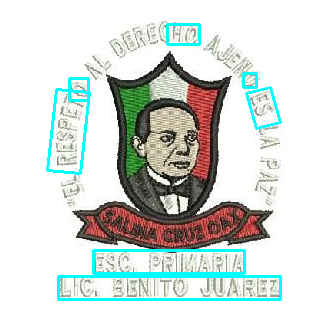

In [15]:
from PIL import Image
image = Image.open("/kaggle/working/inference_results/det_res_Captura de pantalla 2024-09-09 114728.png")
image

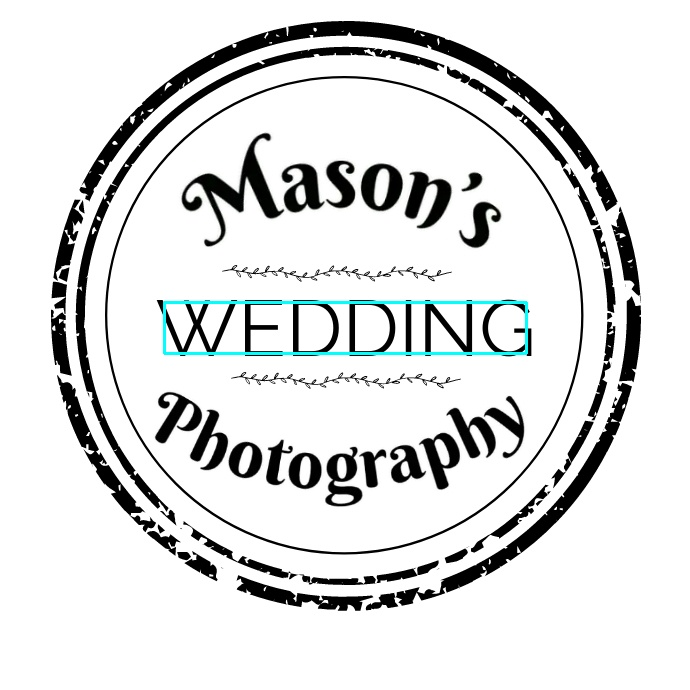

In [16]:
Image.open("/kaggle/working/inference_results/det_res_circular-text-photography-script-logo-design-template-034256fa3021b860a295f4f66c4d321b_screen.jpg")

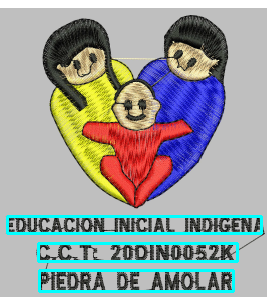

In [17]:
Image.open("/kaggle/working/inference_results/det_res_Captura de pantalla 2024-09-11 141037.png")

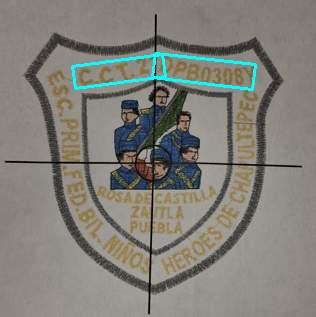

In [18]:
Image.open("/kaggle/working/inference_results/det_res_Captura de pantalla 2024-09-09 115835.png")

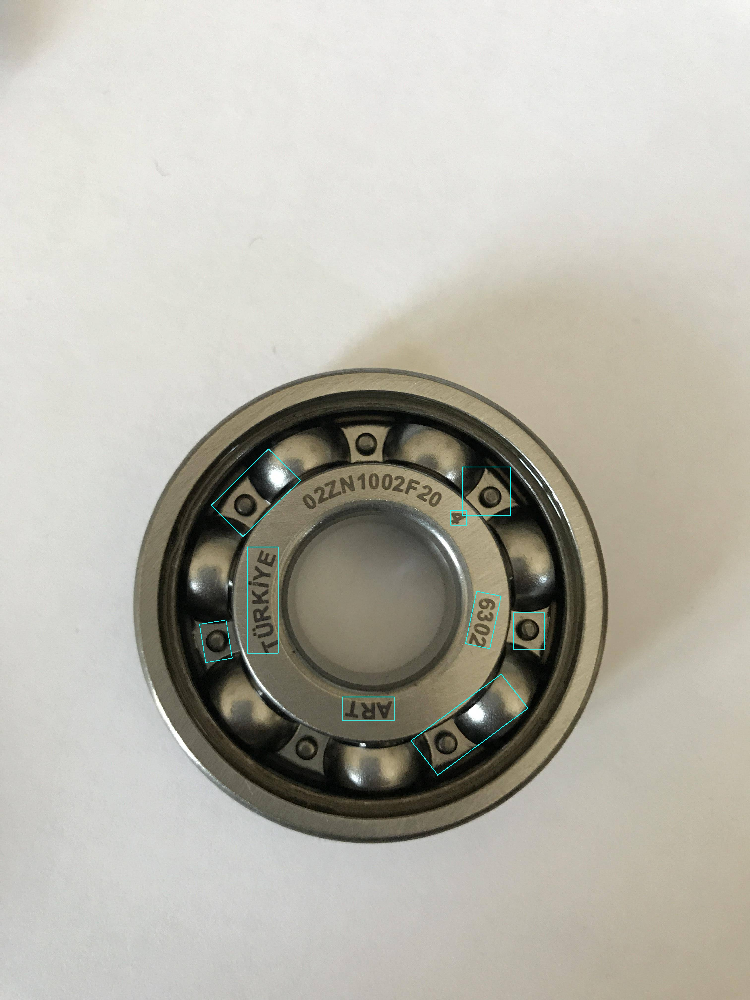

In [19]:
Image.open("/kaggle/working/inference_results/det_res_1oAxJ.jpg")

As we can see in the inference examples, our model struggles with curved text,  despite being fine-tuned on a dataset with this type of text.
Nonetheless, the metrics were not so bad, there is room for improvement, though, with hmean close to 0.70, precision near to 0.78 and recall around 0.62. The reason for these decent metrics is that not all text instances in the images are curved; there are also instances of text in the conventional horizontal layout, where the model performs well.     

All in all, it was a good warm up to learn how to fine-tune the PaddleOCR's detection models. The next time we will try an algorithm specialized in curved text like SAST.

Nothing would make me happier than knowing that my notebook has been helpful to you. If it has, please let me know with a like on the notebook! ❤️